In [1]:
import pandas as pd 
import numpy as np 


import matplotlib.pyplot as plt 
import seaborn as sns 

import warnings 
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns' , None)


In [2]:
books_df = pd.read_csv('Books.csv') 
ratings_df = pd.read_csv('Ratings.csv')
Users_df = pd.read_csv('Users.csv')

In [3]:
ratings_df.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [4]:
Users_df.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [5]:
books_df.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [6]:
# First of all , let's remove the URL images. 
books_df1 = books_df.drop(['Image-URL-S' , 'Image-URL-M' , 'Image-URL-L'] , axis = 1)
books_df1.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company


In [7]:
# Now let's look for duplicate rows , if any. 


def duplicated_rows(df) : 

    print(f"No of duplicate rows: {df.duplicated().sum()}") 

duplicated_rows(books_df1)

No of duplicate rows: 0


In [8]:
def missing_vals(df) : 

    for i in df : 
        print(f"No of missing values in {i} : {df[i].isnull().sum()}") 

missing_vals(books_df1)


No of missing values in ISBN : 0
No of missing values in Book-Title : 0
No of missing values in Book-Author : 2
No of missing values in Year-Of-Publication : 0
No of missing values in Publisher : 2


#### We have two missing values in Book-Author column and Publisher column each. 

In [9]:
missing_vals = books_df1.isnull()

missing_rows = books_df1[missing_vals.any(axis = 1)]

missing_rows

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
118033,0751352497,A+ Quiz Masters:01 Earth,NaN,1999,Dorling Kindersley
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002,NaN
129037,1931696993,Finders Keepers,Linnea Sinclair,2001,NaN
187689,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995,Edinburgh Financial Publishing


In [10]:
# Let's see what are the unique values in the missing value column. 

def missing_cols(df) : 
    for i in df : 
        if df[i].isnull().sum() : 
            print(f"Total missing values in the column : {df[i].isnull().sum()} out of {len(df[i])}")

        else : 
            print("No missing columns.")

missing_cols(books_df1)

No missing columns.
No missing columns.
Total missing values in the column : 2 out of 271360
No missing columns.
Total missing values in the column : 2 out of 271360


#### Let's see how many total number of books are published in every year ? 

In [11]:
# Let's see if ISBN number is unique for all books ? 


print(f"Total no of ISBN in dataframe : {len(books_df1['ISBN'])} and total no of unique ISBN number in dataframe : {len(set(books_df1['ISBN']))}")

Total no of ISBN in dataframe : 271360 and total no of unique ISBN number in dataframe : 271360


In [12]:
dict_no_of_books_every_yr = books_df1.groupby('Year-Of-Publication')['ISBN'].count()[1:].sort_values()

<Axes: xlabel='Year-Of-Publication'>

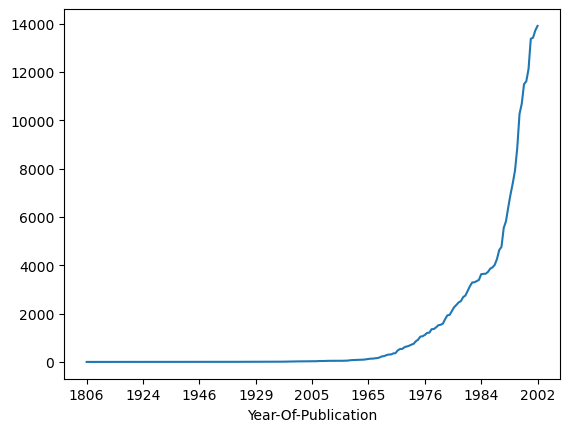

In [13]:
dict_no_of_books_every_yr.plot()

#### We can see there's a rise in Publishing books from 1965 and it had a fall in 2005. 

#### Top 10 Book Authors ? 

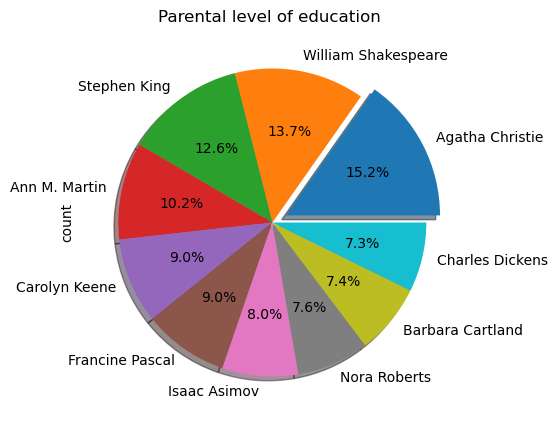

In [14]:
books_df1['Book-Author'].value_counts()[:10].plot(kind = 'pie' , autopct = '%1.1f%%' , shadow = True , explode = [0.1,0,0,0,0,0,0,0,0,0])
plt.title('Parental level of education ')
fig = plt.gcf()
fig.set_size_inches(5,5)
plt.show()

#### Let's understand ratings df . 

In [15]:
ratings_df.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [16]:
ratings_df.tail()

,User-ID,ISBN,Book-Rating
1149775,276704,1563526298,9
1149776,276706,0679447156,0
1149777,276709,0515107662,10
1149778,276721,0590442449,10
1149779,276723,05162443314,8


##### so , there are total 1149779 rows in ratings_df dataframe. 

In [17]:
### Let's see for duplicates if any ? 

duplicated_rows(ratings_df)

No of duplicate rows: 0


In [18]:
missing_cols(ratings_df)

No missing columns.
No missing columns.
No missing columns.


In [19]:
# Let's concat ratings_df and books_df on ISBN . 


merged_df = pd.merge(books_df1, ratings_df, on="ISBN")
merged_df.shape

(1031136, 7)

In [20]:
duplicated_rows(merged_df)

No of duplicate rows: 0


In [21]:
missing_cols(merged_df)

No missing columns.
No missing columns.
Total missing values in the column : 2 out of 1031136
No missing columns.
Total missing values in the column : 2 out of 1031136
No missing columns.
No missing columns.


####  Top 10 rated books in merged df ? 

In [22]:
merged_df.columns

Index(['ISBN', 'Book-Title', 'Book-Author', 'Year-Of-Publication', 'Publisher',
       'User-ID', 'Book-Rating'],
      dtype='object')

In [25]:
#### Books with 10 rating ? 


merged_df[['Book-Rating','Book-Title']].value_counts()[10]

Book-Title
The Da Vinci Code                                                                                                                                                                                                                                                   160
Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))                                                                                                                                                                                                    152
Harry Potter and the Prisoner of Azkaban (Book 3)                                                                                                                                                                                                                   150
The Lovely Bones: A Novel                                                                                                                                                                            

In [26]:
print(f"Total books with 10 ratings in merged_df dataframe : {len(merged_df[['Book-Rating','Book-Title']].value_counts()[10])}")

Total books with 10 ratings in merged_df dataframe : 39311
